# Рынок заведений общественного питания Москвы


**Цели и задачи проекта:** проанализировать текущее положение дел на рынке заведений общественного питания Москвы с целью выработки рекомендаций для инвесторов по открытию кафе с роботами-официантами.

**Входные данные:** данные о заведениях общественного питания Москвы с информацией о названии и типе объекта общественного питания, его принадлежности к сетевому распространению, адресе расположения и количестве посадочных мест.

**Обозначения категорий исходных данных:** Исходные данные для проекта содержатся в файле формата csv. Обозначения переменных для исходного датасета rest_data.csv приведены ниже:

* *id* — идентификатор объекта,
* *object_name* — название объекта общественного питания,
* *chain* — сетевой ресторан,
* *object_type* — тип объекта общественного питания,
* *адрес* — адрес,
* *number* — количество посадочных мест.

**Внешние данные:** использовались для получения дополнительной информации об административно-территориальном делении Москвы, а также геоданных объектов недвижимости, в которых располагаются заведения питания и соответствующих им районов:

* Адресный реестр объектов недвижимости города Москвы - [Портал открытых данных Правительства Москвы](https://data.mos.ru/opendata/7705031674-adresniy-reestr-zdaniy-i-soorujeniy-v-gorode-moskve)

* [Информация о площади и численности населения районов Москвы](https://ru.wikipedia.org/wiki/%D0%A0%D0%B0%D0%B9%D0%BE%D0%BD%D1%8B_%D0%B8_%D0%BF%D0%BE%D1%81%D0%B5%D0%BB%D0%B5%D0%BD%D0%B8%D1%8F_%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D1%8B) 

* Данные [административно-территориального деления Москвы](https://gis-lab.info/qa/moscow-atd.html)

**Обозначения категорий внешних данных:** упрощенные данные адресного реестра недвижимости Москвы содержатся в файле mos_info_simple.csv, а геоданные администативно-территориального деления - в файле data_mo.geojson. Оба файла размещены на гугл-диске в открытом доступе. Обозначения переменных для датасетов приведены ниже:
* *simple_address* - адрес объекта недвижимости без указания города,
* *adm_area* - название административного округа Москвы,
* *district* - название района или поселения Москвы,
* *geodata_center* - геоданные объектов недвижимости, представленные в формате WKB (well-known binary).
* *geometry* - координаты широты и долготы районов города, формирующие полигональные области.

**План работы** над проектом включает в себя выполнение следующих шагов:
* *Импорт данных и изучение общей информации.* На этом этапе получаем общую информацию об имеющихся у нас в распоряжении данных, их типах, полноте и правильности представления. Предварительно оцениваем объем данных в исходном датасете, а также присутствие пропусков и дубликатов.

* *Подготовка данных.* В этой части работы обращаем пристальное внимание на недостатки исходных данных и их релевантность: анализируем пропуски, приводим названия заведений к нижнему регистру, оцениваем необходимость обработки пропусков в данных, преобразуем данные в верный тип, проверяем их на присутствие ошибочных значений и обрабатываем дубликаты с целью исключения искажений в результатах. 

* *Расчет и анализ данных.* В разделе представлены результаты исследование рынка общественного питания в основе которых лежат ответы на следующие вопросы: (1) в каком соотношении представлены на рынке виды объектов общественного питания, (2) какова доля сетевых и несетевых заведений, (3) как заведения различных видов и сетевой принадлежности распределены по числу посадочных мест. С использованием внешних данных проведен анализ о районах и улицах города, которые являются лидерами и аутсайдерами по числу заведений питания. Подготовлена визуализация с использованием геоданных.  

* *Формулирование общего вывода*. На заключительном этапе приводится сумма выводов и рекомендаций по каждой части выполненного проекта. В общем выводе на основе имеющихся данных и анализа мы отразим ключевые рекомендации для инвесторов и подготовим презентацию по теме исследования.

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Импорт-данных-и-изучение-общей-информации" data-toc-modified-id="Импорт-данных-и-изучение-общей-информации-1">Импорт данных и изучение общей информации</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2">Предобработка данных</a></span></li><li><span><a href="#Расчеты-и-анализ-данных" data-toc-modified-id="Расчеты-и-анализ-данных-3">Расчеты и анализ данных</a></span><ul class="toc-item"><li><span><a href="#Cоотношение-видов-объектов-общественного-питания" data-toc-modified-id="Cоотношение-видов-объектов-общественного-питания-3.1">Cоотношение видов объектов общественного питания</a></span></li><li><span><a href="#Cоотношение-сетевых-и-несетевых-заведений" data-toc-modified-id="Cоотношение-сетевых-и-несетевых-заведений-3.2">Cоотношение сетевых и несетевых заведений</a></span></li><li><span><a href="#Распределение-сетевых-заведений-по-числу-посадочных-мест" data-toc-modified-id="Распределение-сетевых-заведений-по-числу-посадочных-мест-3.3">Распределение сетевых заведений по числу посадочных мест</a></span></li><li><span><a href="#Среднее-число-посадочных-мест-по-видам-объектов-общественного-питания" data-toc-modified-id="Среднее-число-посадочных-мест-по-видам-объектов-общественного-питания-3.4">Среднее число посадочных мест по видам объектов общественного питания</a></span></li><li><span><a href="#ТОП-10-лидеров-по-количеству-объектов-общественного-питания" data-toc-modified-id="ТОП-10-лидеров-по-количеству-объектов-общественного-питания-3.5">ТОП-10 лидеров по количеству объектов общественного питания</a></span><ul class="toc-item"><li><span><a href="#Обработка-адреса-заведения" data-toc-modified-id="Обработка-адреса-заведения-3.5.1">Обработка адреса заведения</a></span></li><li><span><a href="#Добавление-административных-округов-и-районов" data-toc-modified-id="Добавление-административных-округов-и-районов-3.5.2">Добавление административных округов и районов</a></span></li><li><span><a href="#Добавление-геоданных" data-toc-modified-id="Добавление-геоданных-3.5.3">Добавление геоданных</a></span></li><li><span><a href="#Улицы-лидеры-по-количеству-объектов-общественного-питания" data-toc-modified-id="Улицы-лидеры-по-количеству-объектов-общественного-питания-3.5.4">Улицы-лидеры по количеству объектов общественного питания</a></span></li><li><span><a href="#Районы-лидеры-по-числу-заведений-общественного-питания" data-toc-modified-id="Районы-лидеры-по-числу-заведений-общественного-питания-3.5.5">Районы-лидеры по числу заведений общественного питания</a></span></li></ul></li><li><span><a href="#Улицы-с-одним-объектом-общественного-питания" data-toc-modified-id="Улицы-с-одним-объектом-общественного-питания-3.6">Улицы с одним объектом общественного питания</a></span></li><li><span><a href="#Распределение-числа-посадочных-мест-для-улиц-с-большим-количеством-объектов-питания" data-toc-modified-id="Распределение-числа-посадочных-мест-для-улиц-с-большим-количеством-объектов-питания-3.7">Распределение числа посадочных мест для улиц с большим количеством объектов питания</a></span></li><li><span><a href="#Потенциальные-районы-для-размещения-кафе" data-toc-modified-id="Потенциальные-районы-для-размещения-кафе-3.8">Потенциальные районы для размещения кафе</a></span></li></ul></li><li><span><a href="#Общие-выводы" data-toc-modified-id="Общие-выводы-4">Общие выводы</a></span></li><li><span><a href="#Презентация" data-toc-modified-id="Презентация-5">Презентация</a></span></li></ul></div>

## Импорт данных и изучение общей информации

In [1]:
# установка пакета Shapely для управления и анализа плоских геометрических объектов
!pip install shapely -q

# установка пакета Folium и Geopandas для визуализации геоданных 
!pip install folium -q
!pip install geopandas -q

# установка обновлений пакетов Seaborn и Plotly для визуализации данных
!pip install seaborn --upgrade -q
!pip install plotly==5.1.0 -q

!pip install bs4 -q
!pip install lxml -q

In [2]:
import pandas as pd
import numpy as np

# библиотека для работы с регулярными выражениями
import re

# HTTP библиотека для Python
import requests

# файловый API для чтения и записи байтовых объектов
from io import BytesIO

# модули для работы с двоичным представлением векторной геометрии в шестнадцатеричных строках (WKB) и их конвертации 
from shapely import wkb
from shapely.geometry import shape

# графические библиотеки
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.figure_factory import create_distplot

# библиотеки геоданных
import folium
from folium.plugins import StripePattern

import geopandas as gpd


# Импорт библиотеки для автоматического парсинга странички
from bs4 import BeautifulSoup

In [3]:
df = pd.read_csv('https://code.s3.yandex.net/datasets/rest_data.csv')

Ознакомимся с имеющимся исходным датасетом *rest_data* заведений общественного питания г.Москвы, используя следующий шаблон-функцию:

In [4]:
def general_info(dataset):
    """
    Функция дает краткую информацию о размере датасета и типах данных, а также проверяет на присутствие полных дубликатов
    """
    # оформление комментариев при выводе данных
    class color:
       RED = '\033[91m'
       BOLD = '\033[1m'
       END = '\033[0m'
    
    # Вывод всех колонок датасета из запроса
    print('')
    print(color.RED + color.BOLD + 'Информация, включающая записи датасета:' + color.END)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_colwidth', 130)
    display(dataset.head())
    
    # Вывод информации о размере датасета, типе данных и пропущенных/минимальных/максимальных значениях 
      
    print(color.RED + color.BOLD + 'Информация о размере датасета, типе данных и пропущенных значениях:' + color.END)
    print('')
    dataset.info()
          
    # Вывод информации о количестве дубликатов
    print('')
    duplicates_amount = dataset.duplicated().sum()
    print(color.RED + color.BOLD + 'Количество полных дубликатов в данных:'+ color.END, duplicates_amount)

In [5]:
general_info(df)


Информация, включающая записи датасета:


,id,object_name,chain,object_type,address,number
0,151635,СМЕТАНА,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48
1,77874,Родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35
2,24309,Кафе «Академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95
3,21894,ПИЦЦЕТОРИЯ,да,кафе,"город Москва, Абрамцевская улица, дом 1",40
4,119365,Кафе «Вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50


Информация о размере датасета, типе данных и пропущенных значениях:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15366 entries, 0 to 15365
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           15366 non-null  int64 
 1   object_name  15366 non-null  object
 2   chain        15366 non-null  object
 3   object_type  15366 non-null  object
 4   address      15366 non-null  object
 5   number       15366 non-null  int64 
dtypes: int64(2), object(4)
memory usage: 720.4+ KB

Количество полных дубликатов в данных: 0


**Промежуточные выводы:**
* Данные файла формата csv представлены в требуемой кодировке и не имеют нечитаемых символов;
* Исходный датасет с информацией о заведениях общественного питания содержит 15366 записей, разделенной по 6-ти параметрам-характеристикам;
* Названия колонок датасета представлены корректно;
* Типы данных колонок не требуют преобразований;
* Датасет не содержит пропусков и полных дубликатов, но требует дополнительной проверки на наличие дубликатов без учета id;
* Требуется привести названия заведений к нижнему регистру и заменить букву *ё* на *е* в названиях заведений. 

## Предобработка данных

Приведем названия заведениях общественного питания Москвы к нижнему реестру для более подробной проверки на присутствие дубликатов в исходном датасете:

In [6]:
df['object_name'] = df['object_name'].str.lower()

Заменим букву 'ё' на 'е' в адресах заведений:

In [7]:
df['address'] = df['address'].str.replace('ё', 'е')

Ознакомимся с имеющимися дубликатами без учёта идентификатора заведения в реестре:

In [8]:
df_duplicates = df[df.duplicated(['object_name','chain','object_type','address','number'])].sort_values(by='address')
display(df_duplicates.head())
df_duplicates.shape

,id,object_name,chain,object_type,address,number
5185,107442,кафе,нет,кафе,"город Москва, 1-я Останкинская улица, дом 55",20
5190,107480,кафе,нет,кафе,"город Москва, 1-я Останкинская улица, дом 55",5
5188,107466,кафе,нет,кафе,"город Москва, 1-я Останкинская улица, дом 55",5
5186,107574,кафе,нет,кафе,"город Москва, 1-я Останкинская улица, дом 55",10
2381,28611,комбинат питания мгту им.н.э.баумана,нет,столовая,"город Москва, 2-я Бауманская улица, дом 5, строение 1",100


(85, 6)

Исходный датасет включает в себя 85 строк-дубликатов. Удалим из датасета имеющиеся дубликаты заведений:

In [9]:
df = df.drop_duplicates(['object_name','chain','object_type','address','number'])

**Промежуточные выводы:**
* Исходный датасет включает в себя 85 строк-дубликатов заведений, которые были исключены из дальнейшего анализа.

## Расчеты и анализ данных

### Cоотношение видов объектов общественного питания

Рассмотрим предварительное процентное распределение типов заведений общественного питания г. Москвы и их соотношение по принадлежности к сетевым компаниям:

In [10]:
counts = df['object_type'].value_counts()
percent = counts / counts.sum()
fmt = '{:.1%}'.format
food_object_type = (
    pd.DataFrame({'counts': counts, 'pct': percent.map(fmt)})
    .reset_index()
    .rename(columns={'index':'object_type'})
)
display(food_object_type)

,object_type,counts,pct
0,кафе,6071,39.7%
1,столовая,2584,16.9%
2,ресторан,2282,14.9%
3,предприятие быстрого обслуживания,1897,12.4%
4,бар,855,5.6%
5,буфет,576,3.8%
6,кафетерий,395,2.6%
7,закусочная,348,2.3%
8,магазин (отдел кулинарии),273,1.8%


Из таблицы видно, что заведения общественного питания, в основном, представлены кафе, чья доля сопоставима с суммарной долей столовых, ресторанов и фастфудов. Кафетерии, закусочные и кулинарии - типы заведений, наименее распространенные на рынке общественного питания Москвы. Ниже представим полученные данные в виде диаграммы:

In [11]:
def annotation_graphs(graph, layout='h'):
    '''Функция добавляет аннотацию значений на графики в зависимости от горизонтальной (h) или вертикальной (v) ориентации
    столбцов барплота'''
    if layout == 'h':
        for p in graph.patches:
            graph.annotate(format(p.get_width(), '.0f'), 
                           (p.get_x() + p.get_width() + 200, p.get_y() + p.get_height()), 
                           ha = 'center', va = 'center', 
                           xytext = (0, 9), 
                           textcoords = 'offset points')
         
    else: 
        for p in graph.patches:
            graph.annotate(format(p.get_width(), '.0f'), 
                           (p.get_x() + p.get_width() + 3, p.get_y() + p.get_height()), 
                           ha = 'center', va = 'center', 
                           xytext = (0, 9), 
                           textcoords = 'offset points')

In [12]:
#plt.figure(figsize=(11, 7))

#g = sns.barplot(x='counts', y='object_type', data = food_object_type, color = 'deepskyblue')
#g.set_title('Cоотношение видов объектов общественного питания по их количеству')
#g.set(ylabel=None)
#g.set_xlabel('Количество заведений (ед.)')
#sns.despine(left=False, bottom=False, right=True)

# Аннотация и вывод графика
#annotation_graphs(g, 'h')
#plt.show()

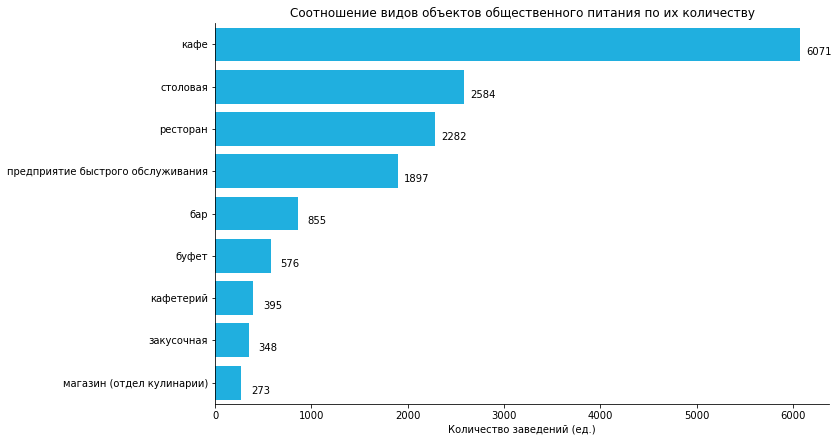

In [13]:
plt.figure(figsize=(11, 7))
g = sns.barplot(x='counts', y='object_type', data = food_object_type, color = 'deepskyblue')

def graph(func):
    def graph_wrapper():
        g.set_title('Cоотношение видов объектов общественного питания по их количеству')
        g.set(ylabel=None)
        g.set_xlabel('Количество заведений (ед.)')
        sns.despine(left=False, bottom=False, right=True)
        
        func()
    return(graph_wrapper)

@graph
def annotation():
    for p in g.patches:
        g.annotate(format(p.get_width(), '.0f'),
                   (p.get_x() + p.get_width() + 200, p.get_y() + p.get_height()),
                   ha = 'center', va = 'center', xytext = (0, 9), textcoords = 'offset points')   
annotation()
plt.show()

### Cоотношение сетевых и несетевых заведений

Сравним общее процентное соотношение сетевых и несетевых заведений:

In [14]:
df['chain'].value_counts(normalize=True).round(2)*100

нет    81.0
да     19.0
Name: chain, dtype: float64

Доля заведений, относящихся к сетям (вариант: да), составляет примерно пятую часть от всех заведений общественного питания. Рассмотрим распределение по сетевой принадлежности в разрезе типов заведений общественного питания:

In [15]:
# число сетевых и несетевых заведений

chain_object_type = (
    df.pivot_table(index = 'object_type',
                   columns = 'chain',
                   values = 'id',
                   aggfunc = 'count')
)

chain_object_type = (
    chain_object_type.reset_index()
                     .rename(columns={'да':'n_chain', 'нет':'n_individ'})
                     .rename_axis(None, axis=1)
)

# общее число заведений по типу объекта

chain_object_type['n_total'] = chain_object_type[['n_chain', 'n_individ']].sum(axis=1)

# процент сетевых и несетевых заведений по типу объекта

chain_object_type['pct_chain'] = (
    chain_object_type['n_chain'] / chain_object_type['n_total']*100
).round(1)

chain_object_type['pct_individ'] = (
    chain_object_type['n_individ'] / chain_object_type['n_total']*100
).round(1)

# процент сетевых и несетевых типов заведений в общем числе заведений

chain_object_type['pct_chain_of_total_sum'] = (
    chain_object_type['n_chain'] / chain_object_type['n_total'].sum()*100
).round(2)

chain_object_type['pct_individ_of_total_sum'] = (
    chain_object_type['n_individ'] / chain_object_type['n_total'].sum()*100
).round(2)

chain_object_type

,object_type,n_chain,n_individ,n_total,pct_chain,pct_individ,pct_chain_of_total_sum,pct_individ_of_total_sum
0,бар,37,818,855,4.3,95.7,0.24,5.35
1,буфет,11,565,576,1.9,98.1,0.07,3.70
2,закусочная,56,292,348,16.1,83.9,0.37,1.91
3,кафе,1396,4675,6071,23.0,77.0,9.14,30.59
4,кафетерий,52,343,395,13.2,86.8,0.34,2.24
5,магазин (отдел кулинарии),78,195,273,28.6,71.4,0.51,1.28
6,предприятие быстрого обслуживания,788,1109,1897,41.5,58.5,5.16,7.26
7,ресторан,543,1739,2282,23.8,76.2,3.55,11.38
8,столовая,3,2581,2584,0.1,99.9,0.02,16.89


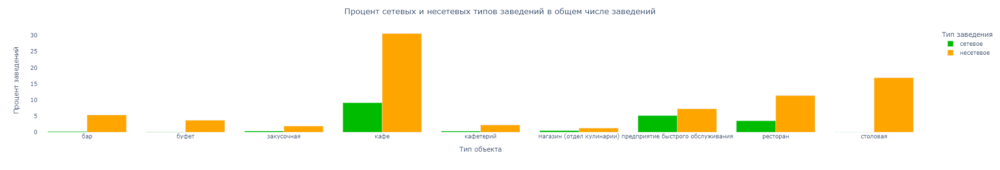

In [16]:
fig = (px.bar(chain_object_type,
              x='object_type',
              y=['pct_chain_of_total_sum', 'pct_individ_of_total_sum'],
              barmode = 'group',
              hover_data={'variable':False},
              labels={'variable': 'Тип заведения', 'value':'% заведений', 'object_type':'тип объекта'},
              color_discrete_map={'pct_chain_of_total_sum':'#00bc00','pct_individ_of_total_sum':'#ffa500'})
      )

fig.for_each_trace(lambda t: t.update(name=t.name.replace('pct_chain_of_total_sum', 'сетевое')))
fig.for_each_trace(lambda t: t.update(name=t.name.replace('pct_individ_of_total_sum', 'несетевое')))

fig.update_layout(
    title='Процент сетевых и несетевых типов заведений в общем числе заведений',
    xaxis_title='Тип объекта',
    yaxis_title='Процент заведений',
    plot_bgcolor='#ffffff'
)

fig.update(layout=dict(title=dict(x=0.5)))

fig.show()

Распределение доли сетевых и несетевых заведений общественного питания в общем числе заведений Москвы показывает, что среди несетевых типов заведений превалируют кафе, столовые и рестораны. Сетевой характер бизнеса привлекателен для кафе, предприятий быстрого обслуживания и ресторанов.

Далее рассмотрим более подробно, для какого вида объекта общественного питания характерно сетевое распространение:

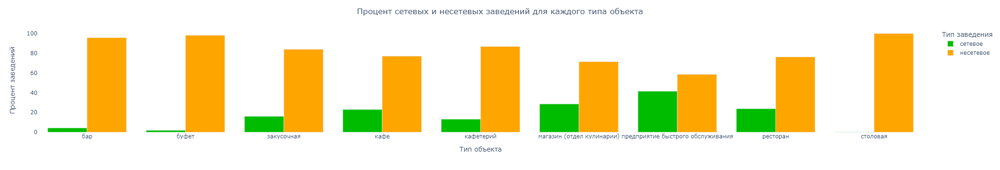

In [17]:
fig = (px.bar(chain_object_type,
              x='object_type',
              y=['pct_chain', 'pct_individ'],
              barmode = 'group',
              hover_data={'variable':False},
              labels={'variable': 'Тип заведения', 'value':'% заведений', 'object_type':'тип объекта'},
              color_discrete_map={'pct_chain':'#00bc00','pct_individ':'#ffa500'})
      )

fig.for_each_trace(lambda t: t.update(name=t.name.replace('pct_chain', 'сетевое')))
fig.for_each_trace(lambda t: t.update(name=t.name.replace('pct_individ', 'несетевое')))

fig.update_layout(
    title='Процент сетевых и несетевых заведений для каждого типа объекта',
    xaxis_title='Тип объекта',
    yaxis_title='Процент заведений',
    plot_bgcolor='#ffffff'
)

fig.update(layout=dict(title=dict(x=0.5)))

fig.show()

Из диаграммы видно, что для Москвы сетевое распространение характерно для предприятий быстрого обслуживания (фастфудов), а также отделов кулинарий, которые чаще всего находятся в продуктовых магазинах торговых сетей. Третью строчку популярности сетевой организации бизнеса делят рестораны и кафе. Наименьшую склонность к сетевой организации питания Москвы имеют столовые. Следует однако учитывать, что датасет включают большое количество данных о столовых, принадлежащих государственным учреждениям и предприятиям. Это, в некоторой степени, может исказить представление о потенциале распространении сетевого подхода в этом сегменте, часто наблюдаемое в других городах.

### Распределение сетевых заведений по числу посадочных мест

Сформируем набор данных, включающий только сетевые заведения питания:

In [18]:
df_chain_seats = df.query('chain == "да"')
df_chain_seats.describe().round(0)

,id,number
count,2964.0,2964.0
mean,118096.0,53.0
std,67521.0,57.0
min,838.0,0.0
25%,59187.0,15.0
50%,129968.0,40.0
75%,176804.0,72.0
max,223318.0,580.0


Среднее число посадочных мест для сетевых заведений равно 53-м, медианное - 40.

С точки зрения анализа выбросов по числу посадочных мест также посчитаем 95-й персентиль:

In [19]:
chain_seats_95_percentile = np.percentile(df_chain_seats['number'], 95)
chain_seats_95_percentile
df_chain_seats_95_percentile = df_chain_seats[df_chain_seats['number'] < chain_seats_95_percentile]

In [20]:
df_chain_seats_95_percentile.describe().round(0)

,id,number
count,2815.0,2815.0
mean,120634.0,44.0
std,67262.0,37.0
min,19613.0,0.0
25%,68446.0,14.0
50%,134638.0,36.0
75%,178892.0,64.0
max,223318.0,158.0


Среднее число посадочных мест для сетевых заведений с учетом исключения аномальных значений равно 44-м, медианное - 36.

Изобразим на диаграммах размаха и распределения полученные результаты для сетевых заведений общественного питания:

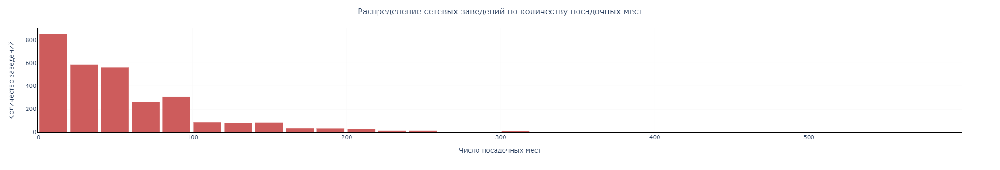

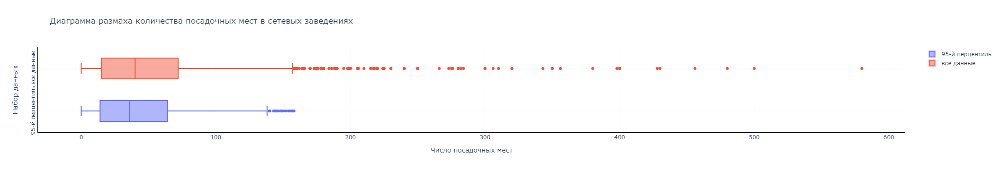

In [21]:
fig = (
    px.histogram(
        df_chain_seats,
        x='number',
        nbins = 40,
        color_discrete_sequence=['indianred'],
        labels={'number': 'число мест'})

        )
fig.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='#f9f9f9')
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', gridcolor='#f9f9f9')

fig.update_layout(
    title='Распределение сетевых заведений по количеству посадочных мест',
    xaxis_title='Число посадочных мест',
    yaxis_title='Количество заведений',
    plot_bgcolor='#ffffff'
)

fig.update_layout(bargap=0.1)
fig.update(layout=dict(title=dict(x=0.5)))

fig.show()

fig = go.Figure()
fig.add_trace(go.Box(name='95-й перцентиль', x=df_chain_seats_95_percentile['number']))
fig.add_trace(go.Box(name='все данные', x=df_chain_seats['number']))

fig.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='#f9f9f9')
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', gridcolor='#f9f9f9')

fig.update_layout(
    title='Диаграмма размаха количества посадочных мест в сетевых заведениях',
    xaxis_title='Число посадочных мест',
    yaxis_title='Набор данных',
    plot_bgcolor='#ffffff'
)

fig.update_yaxes(
        tickangle = -90)

fig.show()

Из диаграмм размаха видно, что несмотря на присутствие выбросов (что является естественным отражением действительности, а не искажением вследствие ошибок), медианные значения числа посадочных мест изменяются незначительно. Это позволяет использовать весь набор данных, без необходимости выделения "типичного" набора заведений. 

Ответим на вопрос, что характерно для сетевых заведений: обширная сеть с небольшим числом посадочных мест в каждом заведении или небольшая сеть, но с большим количеством посадочных мест в заведениях.

(1) Используем сформированный датасет сетевых заведений:

In [22]:
df_chain_seats.head()

,id,object_name,chain,object_type,address,number
3,21894,пиццетория,да,кафе,"город Москва, Абрамцевская улица, дом 1",40
6,148815,брусника,да,кафе,"город Москва, переулок Сивцев Вражек, дом 6/2",10
13,22579,алло пицца,да,кафе,"город Москва, улица Авиаторов, дом 14",32
16,144107,суши wok,да,предприятие быстрого обслуживания,"город Москва, Азовская улица, дом 3",7
18,58565,тануки,да,ресторан,"город Москва, Большая Академическая улица, дом 65",160


(2) Внесем основные изменения в дублирующие названия заведений. 

*Использование лемматизации достаточно затруднительно в этом случае из-за использования большого числа повторяющихся слов как в названии заведения, так и в описании типа объекта. Вероятно, возможно использование дополнительных алгоритмов для обработки, но вероятность ошибки также высока.

In [23]:
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кафе', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('ресторан', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кофейня', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('пиццерия', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('закусочная', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('предприятие быстрого обслуживания', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('предприятие быстрого питания', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('быстрого питания', '') 
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кулинарная лавка братьев караваевых', 'братья караваевы')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('пбо', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('«', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('»', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('kfc', 'kfc')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('сабвей', 'subway')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('старбакс', 'starbucks')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace(' автозаводская', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace(' шаболовка', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace(' октябрьская', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace(' domino,s pizza', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('-пекарея', '')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('мята lounge', 'мята')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кальян-бар', 'мята')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('иль патио планета суши', 'иль патио')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('starbucks starbucks', 'starbucks')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('паб кружка', 'кружка')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('суши вок', 'суши wok')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('коста кофе', 'costa coffee')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('брава коста кофе', 'costa coffee')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('брава costa coffee', 'costa coffee')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('мск московская сеть кальянных на шаболовке', 'мск московская сеть кальянных')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('tgi tgi fridays', 'tgi fridays')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('fridays', 'tgi fridays')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('fridays kfc', 'kfc')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('kfc волгоградский', 'kfc')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('пбо kfc покрышкина', 'kfc')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('пбо kfc', 'kfc')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('быстрого питания kfc', 'kfc')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('магбургер азс №16', 'магбургер')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('магбургер азс №17', 'магбургер')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('il forno иль форно', 'иль форно')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('бургер кинг burger king', 'бургер кинг')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('burger king', 'бургер кинг')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кофемания,  бармалини', 'кофемания')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('coffeeshop company', 'coffeeshop')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кофешоп coffeeshop company', 'coffeeshop')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('анти- кальянная moskalyan', 'moskalyan')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('алло пицца 2', 'алло пицца')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('братья караваевых', 'братья караваевы')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('сеть магазинов суши wok', 'суши wok')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('пицерия папа джонс', 'папа джонс')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('стардогс стардогs', 'стардогs')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('пончиковое  икеа ikea', 'ikea')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('икеа', 'ikea')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('ростикс kfc', 'kfc')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('советские времена чебуречная ссср', 'чебуречная ссср')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('павлин мавлин чайхона №1', 'чайхона №1')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('вlack burger чайхона №1', 'чайхона №1')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('папа джонс пицца', 'папа джонс')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кондитерия тирольские пироги', 'тирольские пироги')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('- бургер кинг', 'бургер кинг')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('братья караваевы братья караваевы', 'братья караваевы')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('subway subway', 'subway')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('subway subway', 'subway')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кофе-хаус', 'кофе хаус')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кондитерская волконский', 'волконский')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кондитерская-пекарня волконский', 'волконский')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('волконский пекарня', 'волконский')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('кондитерская-пекарня волконский', 'волконский')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('точка продажи готовой еды милти', 'милти')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('магазин готовой еды милти', 'милти')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('готовые блюда милти', 'милти')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('детское  андерсон', 'андерсон')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('детский клуб андерсон', 'андерсон')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('семейное  и кондитерская андерсон', 'андерсон')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.replace('семейное  андерсон', 'андерсон')
df_chain_seats['object_name'] = df_chain_seats['object_name'].str.lstrip()

In [24]:
print(df_chain_seats['object_name'])
MODEL = 'ruscorpora_upos_cbow_300_20_2019'
FORMAT = 'csv'
WORD = df_chain_seats.at[df_chain_seats.index[19], 'object_name']

print(WORD)

3         пиццетория
6           брусника
13        алло пицца
16          суши wok
18            тануки
            ...     
15361    шоколадница
15362    шоколадница
15363    шоколадница
15364    шоколадница
15365    шоколадница
Name: object_name, Length: 2964, dtype: object
тануки


In [25]:
def api_neighbor(m, w, f):
    neighbors = {}
    url = '/'.join(['http://rusvectores.org', m, w, 'api', f]) + '/'
    r = requests.get(url=url, stream=True)
    for line in r.text.split('\n'):
        try: # первые две строки в файле -- служебные, их мы пропустим
            word, sim = re.split('\s+', line) # разбиваем строку по одному или более пробелам
            neighbors[word] = sim
        except:
            continue
    return neighbors

In [26]:
print(api_neighbor(MODEL, WORD, FORMAT))

{'тануки_NOUN': 'frequencies'}


(3) Сформируем сводную таблицу сетевых заведений, учитывающую их количество и число мест для посетителей:

In [27]:
df_chain_size_seats = (
    df_chain_seats.groupby('object_name')
                  .agg({'object_name':'count', 'number':'mean'}).astype('int')
                  .rename(columns={'object_name':'size'})
                  .sort_values(by='size', ascending=False)
                  .reset_index()
)

df_chain_size_seats.head(10)

,object_name,size,number
0,kfc,186,55
1,шоколадница,183,57
2,макдоналдс,171,87
3,бургер кинг,159,48
4,теремок,109,27
5,домино'с пицца,99,18
6,крошка картошка,96,21
7,суши wok,89,6
8,милти,81,1
9,папа джонс,67,22


(4) Для построения диаграммы распределения, установим ограничение на минимальное число заведений, входящих в сеть равное 7, с целью исключить влияние неточностей, вызванных возможным дублированием названий компаний и повышения качества данных для анализа.

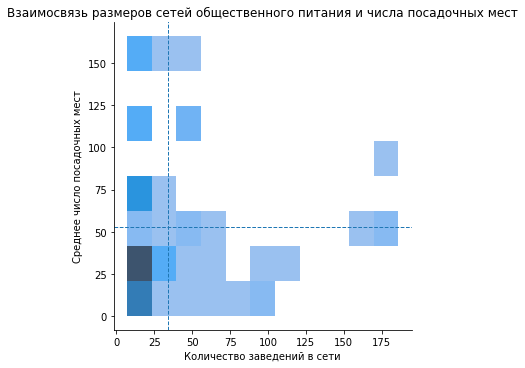

In [28]:
df_chain_size7_seats = df_chain_size_seats.query('size >=7')
mean_chain_size = df_chain_size7_seats['size'].mean()
mean_chain_sets_number = df_chain_size7_seats['number'].mean()

g = sns.displot(x='size', y='number', data=df_chain_size7_seats)

plt.axvline(mean_chain_size, 0,160, linestyle = '--', linewidth = 1) 
plt.axhline(mean_chain_sets_number, 0,175, linestyle = '--', linewidth = 1) # 53 - среднее число посадочных мест

plt.title('Взаимосвязь размеров сетей общественного питания и числа посадочных мест')
plt.xlabel('Количество заведений в сети')
plt.ylabel('Среднее число посадочных мест')

plt.show()

Из диаграмм распределения видно, что для сетевых объектов питания более характерно распространение небольшого числа заведений с небольшим или средним числом посадочных мест. Исключением может являться сеть быстрого питания Макдональдс, для которой помимо большого размаха сети характерно большое количество посадочных мест.  

### Среднее число посадочных мест по видам объектов общественного питания

Посчитаем среднее число посадочных мест для различных типов заведений:

In [29]:
df_object_seats = (df.groupby('object_type').agg({'number':'mean'})
                                            .round(0).astype(int)
                                            .sort_values(by='number', ascending=False)
                                            .reset_index()
)
df_object_seats

,object_type,number
0,столовая,130
1,ресторан,97
2,буфет,51
3,бар,44
4,кафе,40
5,предприятие быстрого обслуживания,21
6,кафетерий,9
7,закусочная,8
8,магазин (отдел кулинарии),6


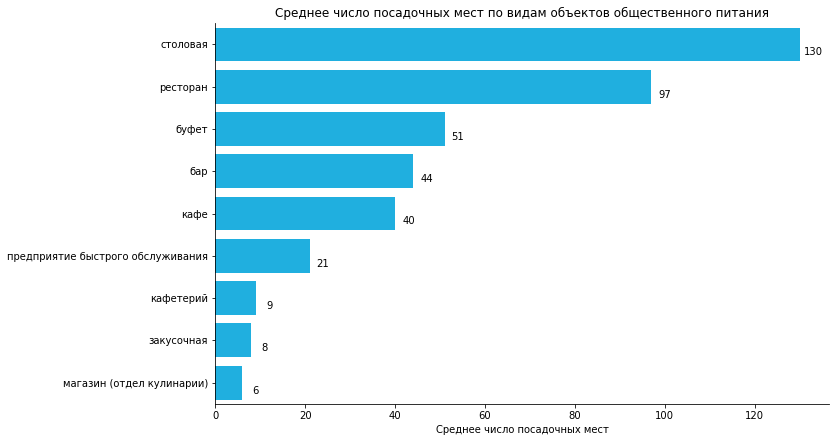

In [30]:
plt.figure(figsize=(11, 7))

g = sns.barplot(x='number', y='object_type', data = df_object_seats, color = 'deepskyblue')
g.set_title('Среднее число посадочных мест по видам объектов общественного питания')
g.set(ylabel=None)
g.set_xlabel('Среднее число посадочных мест')
sns.despine(left=False, bottom=False, right=True)

# Аннотация и вывод графика
annotation_graphs(g, 'h_seats')
plt.show()

Столовые и рестораны, традиционно предоставляют возможность разместить в заведениях большое число людей. В первом случае это связано с повседневным использованием столовых населением, во втором - предоставление возможности проведения праздничных или деловых мероприятий с повышенным уровнем сервиса. Предприятия быстрого обслуживания, помимо традиционного размещения посетителей в зале, позиционируют себя как оказывающие услуги на вынос, что не требует избыточных площадей. Закусочные и отделы кулинарии, как правило, направлены на оказание минимальных услуг по приобретению готовых блюд "на вынос" и изначально ограничены небольшой площадью в торговых центрах.   

### ТОП-10 лидеров по количеству объектов общественного питания

Для анализа улиц и районов города, на которых расположены объекты питания подготовим исходный датасет и данные с внешних ресурсов.

#### Обработка адреса заведения

Используя регулярные выражения, из адреса заведения выделим в отдельные колонки информацию о городе, районе (относится к населенным пунктам Новой Москвы), улице и данных здания:

In [31]:
df['city'] = df['address'].str.extract(rf'(город Москва)')
df['city'] = df['city'].fillna('город Москва')

In [32]:
keywords_territory = 'поселение|Зеленоград|Троицк|Щербинка|Московский|"Мосрентген"'
df['territory'] = df['address'].str.extract(rf'([А-Яа-я -]+ (?:{keywords_territory})|(?:{keywords_territory}) [А-Яа-я -]+)', \
                                            flags=re.IGNORECASE)

df['territory'] = (
    df['territory'].str.lstrip()
                  .fillna('город Москва')
)

In [33]:
keywords_street = 'улица|шоссе|проспект|бульвар|площадь|проезд|переулок|микрорайон|квартал|набережная|аллея|линия|деревня|километр|посёлок|тупик|территория|село|просек|вблизи'

df['street'] = df['address'].str.extract(rf'(\d*[А-Яа-я -]+ (?:{keywords_street}) \d*[А-Яа-я -]+|\d*[А-Яа-я -]+ (?:{keywords_street})|(?:{keywords_street}) \d*[А-Яа-я -]+|(?:{keywords_street}) \d*)', flags=re.IGNORECASE)

df['street'] = df['street'].str.lstrip()

In [34]:
keywords_building = 'дом|корпус|домовладение|владение|строение'

df['building'] = df['address'].str.extract(rf'((?:{keywords_building}) [^.]+)')

Дополнительно создадим отдельную колонку *'simple_address'* с указанием адреса, без учета 'город Москва' в адресе заведения для облегчения в дальнейшем объединения датасета с данными сторонних ресурсов:

In [35]:
keywords_simple_address = 'город Москва,'
df['simple_address'] = df['address'].str.extract(rf'((?<={keywords_simple_address}) [^.]+)')
df['simple_address'] = df['simple_address'].str.lstrip()
df['simple_address'].fillna(df['address'], inplace=True)

df.head()

,id,object_name,chain,object_type,address,number,city,territory,street,building,simple_address
0,151635,сметана,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48,город Москва,город Москва,улица Егора Абакумова,дом 9,"улица Егора Абакумова, дом 9"
1,77874,родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35,город Москва,город Москва,улица Талалихина,"дом 2/1, корпус 1","улица Талалихина, дом 2/1, корпус 1"
2,24309,кафе «академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95,город Москва,город Москва,Абельмановская улица,дом 6,"Абельмановская улица, дом 6"
3,21894,пиццетория,да,кафе,"город Москва, Абрамцевская улица, дом 1",40,город Москва,город Москва,Абрамцевская улица,дом 1,"Абрамцевская улица, дом 1"
4,119365,кафе «вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50,город Москва,город Москва,Абрамцевская улица,"дом 9, корпус 1","Абрамцевская улица, дом 9, корпус 1"


Исправим неточности в некоторых названиях поселений Москвы:

In [36]:
df['territory'] = df['territory'].str.replace('город Московский', 'поселение Московский')
df['territory'] = df['territory'].str.replace('город Троицк', 'городской округ Троицк')
df['territory'] = df['territory'].str.replace('город Щербинка', 'городской округ Щербинка')
df['territory'] = df['territory'].str.replace('город Зеленоград', 'Зеленоградский административный округ')

Предварительно рассмотрим какие уникальные населенные пункты, полученные напрямую из адреса заведения, представлены в датасете:

In [37]:
df['territory'].unique()

array(['город Москва', 'Зеленоградский административный округ',
       'поселение Вороновское', 'поселение Внуковское',
       'поселение Новофедоровское', 'поселение Марушкинское',
       'поселение Десеновское', 'городской округ Троицк',
       'городской округ Щербинка', 'поселение Московский',
       'поселение Щаповское', 'поселение Краснопахорское',
       'поселение Воскресенское', 'поселение Сосенское',
       'поселение Роговское', 'поселение Филимонковское',
       'поселение Кленовское', 'поселение Кокошкино',
       'поселение Рязановское', 'поселение Михайлово-Ярцевское',
       'поселение "Мосрентген"', 'поселение Киевский',
       'поселение Первомайское'], dtype=object)

#### Добавление административных округов и районов

Используем данные адресного реестра объектов недвижимости города Москвы [Портал открытых данных Правительства Москвы](https://data.mos.ru/opendata/7705031674-adresniy-reestr-zdaniy-i-soorujeniy-v-gorode-moskve) с целью определения административного округа и района города (а также их геоданных), к которому относится заведение общественного питания, по имеющемуся адресу:

In [38]:
spreadsheet_id = '1BhL0gMZntWaiGp9-eUp7JQX-G6CCQbvO7U-o0-iMHdg'
file_name = 'https://docs.google.com/spreadsheets/d/{}/export?format=csv'.format(spreadsheet_id)


#r = requests.get(file_name)
#info = pd.read_csv(BytesIO(r.content))


info = pd.read_csv(file_name)

info.head()

,simple_address,adm_area,district,geodata_center
0,"Варшавское шоссе, дом 150, строение 2",Южный,Чертаново Южное,0101000000F250A93FF6CC42405807FDC6B4CC4B40
1,"Косинская улица, дом 26А",Восточный,Вешняки,010100000047202E1C02EA42402CC5D479D6DB4B40
2,"Гороховский переулок, дом 21",Центральный,Басманный,01010000009A35CD7381D542407EFE9CC413E24B40
3,"Ленинградский проспект, дом 73А, строение 3",Северный,Сокол,010100000002050BB7B9C142403C0345B8DAE64B40
4,"улица Вострухина, дом 5А",Юго-Восточный,Рязанский,01010000004495E1D819E6424079D15B782ADC4B40


Для корректного объединения данных заменим букву 'ё' на 'е' в адресах заведений датасета *info*:

In [39]:
info['simple_address'] = info['simple_address'].str.replace('ё', 'е')

Проверим реестр на наличие дубликатов и удалим их:

In [40]:
info_duplicates_amount = info.duplicated().sum()
print('Количество дубликатов в адресном реестре:', info_duplicates_amount)

Количество дубликатов в адресном реестре: 102


In [41]:
info = info.drop_duplicates()

Объединим данные о заведениях общественного питания с данными реестра объектов недвижимости города Москвы, используя адрес:

In [42]:
df_info = df.merge(info, how='left', left_on='simple_address', right_on='simple_address')
df_info.head()

,id,object_name,chain,object_type,address,number,city,territory,street,building,simple_address,adm_area,district,geodata_center
0,151635,сметана,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48,город Москва,город Москва,улица Егора Абакумова,дом 9,"улица Егора Абакумова, дом 9",Северо-Восточный,Ярославский,01010000009320773F76DB42401CC0A99182F04B40
1,77874,родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35,город Москва,город Москва,улица Талалихина,"дом 2/1, корпус 1","улица Талалихина, дом 2/1, корпус 1",Центральный,Таганский,0101000000A489DCCB2AD642409012FCCB78DE4B40
2,24309,кафе «академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95,город Москва,город Москва,Абельмановская улица,дом 6,"Абельмановская улица, дом 6",Центральный,Таганский,0101000000384F0735B8D542402C10B66E28DE4B40
3,21894,пиццетория,да,кафе,"город Москва, Абрамцевская улица, дом 1",40,город Москва,город Москва,Абрамцевская улица,дом 1,"Абрамцевская улица, дом 1",Северо-Восточный,Лианозово,01010000006BA952D458C942404DC1D9624DF24B40
4,119365,кафе «вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50,город Москва,город Москва,Абрамцевская улица,"дом 9, корпус 1","Абрамцевская улица, дом 9, корпус 1",Северо-Восточный,Лианозово,0101000000BC74F6A640C942408E57A1B1B8F34B40


Проверим уникальность значений административных округов в сводном датасете:

In [43]:
df_info['adm_area'].unique()

array(['Северо-Восточный', 'Центральный', 'Юго-Восточный', 'Западный',
       'Юго-Западный', 'Северный', 'Восточный', 'Южный',
       'Северо-Западный', 'Зеленоградский', 'Троицкий', 'Новомосковский'],
      dtype=object)

Список и количество административных округов (12) в общем датасете соответствует территориальному делению Москвы.

Проверим соответствие районов города и их количества административному округу в сводном датасете, а также выведем общее число заведений общественного питания в каждом районе:

In [44]:
adm_area_district = (df_info.groupby(['adm_area','district'])['object_name']
                                 .agg('count')
                                 .reset_index()
                                 .rename(columns={'object_name':'n_food_places'})
                    )
adm_area_district

,adm_area,district,n_food_places
0,Восточный,Богородское,103
1,Восточный,Вешняки,77
2,Восточный,Восточное Измайлово,42
3,Восточный,Восточный,4
4,Восточный,Гольяново,87
...,...,...,...
141,Южный,Орехово-Борисово Южное,75
142,Южный,Царицыно,90
143,Южный,Чертаново Северное,121
144,Южный,Чертаново Центральное,150


Сводная таблица включает в себя 146 строк, что соответствует 125-ти муниципальным округам, 19-ти поселениям и 2-м городским округам.

#### Добавление геоданных

Данные адресного реестра объектов недвижимости города Москвы [Портал открытых данных Правительства Москвы](https://data.mos.ru/opendata/7705031674-adresniy-reestr-zdaniy-i-soorujeniy-v-gorode-moskve) помимо информации об объектах недвижимости содержат их геоданные. Геоданные представлены в колонке *geodata_center* двоичным форматом векторной геометрии в шестнадцатеричных строках (WKB - well-known binary). 

Для дальнейшей визуализации преобразуем формат WKB в координаты широты и долготы. Для этого используем модули библиотеки Shapely, позволяющие на первом этапе сконвертировать формат WKB в координаты точки, а на втором - выделить данные точки в координаты широты и долготы. Использование лямбда-функции позволяет повторить эту последовательность действий для всех строк.  

In [45]:
pd.options.display.precision = 15 # точность отображения координат
df_info['point']=df_info.apply(lambda x: wkb.loads(x['geodata_center'], hex=True), axis=1)

point = df_info.apply(lambda x: wkb.loads(x['geodata_center'], hex=True), axis=1)

df_info['longitude']=df_info.apply(lambda x: x['point'].x, axis=1)
df_info['longitude']=df_info['longitude'].apply(lambda x: float(x))

df_info['latitude']=df_info.apply(lambda x: x['point'].y, axis=1).tolist()
df_info['latitude']=df_info['latitude'].apply(lambda x: float(x))

df_info.head()

,id,object_name,chain,object_type,address,number,city,territory,street,building,simple_address,adm_area,district,geodata_center,point,longitude,latitude
0,151635,сметана,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48,город Москва,город Москва,улица Егора Абакумова,дом 9,"улица Егора Абакумова, дом 9",Северо-Восточный,Ярославский,01010000009320773F76DB42401CC0A99182F04B40,POINT (37.71454613987694 55.87898464954944),37.714546139876937,55.878984649549437
1,77874,родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35,город Москва,город Москва,улица Талалихина,"дом 2/1, корпус 1","улица Талалихина, дом 2/1, корпус 1",Центральный,Таганский,0101000000A489DCCB2AD642409012FCCB78DE4B40,POINT (37.67318104046288 55.73806142624119),37.673181040462879,55.738061426241188
2,24309,кафе «академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95,город Москва,город Москва,Абельмановская улица,дом 6,"Абельмановская улица, дом 6",Центральный,Таганский,0101000000384F0735B8D542402C10B66E28DE4B40,POINT (37.66968405587107 55.73560890092662),37.669684055871073,55.735608900926621
3,21894,пиццетория,да,кафе,"город Москва, Абрамцевская улица, дом 1",40,город Москва,город Москва,Абрамцевская улица,дом 1,"Абрамцевская улица, дом 1",Северо-Восточный,Лианозово,01010000006BA952D458C942404DC1D9624DF24B40,POINT (37.57302335773678 55.89298663742611),37.573023357736780,55.892986637426112
4,119365,кафе «вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50,город Москва,город Москва,Абрамцевская улица,"дом 9, корпус 1","Абрамцевская улица, дом 9, корпус 1",Северо-Восточный,Лианозово,0101000000BC74F6A640C942408E57A1B1B8F34B40,POINT (37.57228552850708 55.90407390954998),37.572285528507081,55.904073909549979


Используя данные [административно-территориального деления Москвы](https://gis-lab.info/qa/moscow-atd.html) сформируем датасет с координатами районов города:

In [46]:
mos_districts = (
    gpd.read_file('https://drive.google.com/uc?export=download&id=12CIgTK50u-6kgKb99xzXyRv3NQCBnCGd', driver='GeoJSON')
)
mos_districts.head()

,district,adm_area,geometry
0,поселение Киевский,Троицкий,"MULTIPOLYGON (((36.80310 55.44083, 36.80319 55.44160, 36.80357 55.45162, 36.81253 55.45140, 36.82745 55.45134, 36.83337 55.451..."
1,Филевский Парк,Западный,"POLYGON ((37.42765 55.74821, 37.42849 55.74875, 37.42958 55.74939, 37.43058 55.74976, 37.43162 55.75005, 37.43180 55.75008, 37..."
2,поселение Новофедоровское,Троицкий,"POLYGON ((36.80357 55.45162, 36.80451 55.46551, 36.81521 55.46597, 36.81575 55.47516, 36.81592 55.48426, 36.81607 55.49530, 36..."
3,поселение Роговское,Троицкий,"POLYGON ((36.93724 55.24139, 36.93726 55.24161, 36.93755 55.24195, 36.93794 55.24225, 36.93880 55.24266, 36.93926 55.24285, 36..."
4,"поселение ""Мосрентген""",Новомосковский,"POLYGON ((37.43956 55.62731, 37.44018 55.63042, 37.44059 55.63102, 37.44104 55.63126, 37.44709 55.63301, 37.45211 55.63498, 37..."


#### Улицы-лидеры по количеству объектов общественного питания

Получим предварительные данные об улицах-лидерах по числу заведений общественного питания Москвы. Запрос сформулируем без учета улиц Новой Москвы, чтобы исключить искусственное увеличение числа заведений из-за возможного совпадения названий улиц в городе и поселениях (дополнительная проверка показала, что таких совпадений для улиц-лидеров нет).

In [47]:
df_streets_top10 = (df_info.groupby(['street','territory'])
                      .agg({'object_name':'count'})
                      .rename(columns={'object_name':'n_street_places'})
                      .sort_values(by='n_street_places', ascending=False)
                      .reset_index()
                      .head(10)
)
                    
df_streets_top10

,street,territory,n_street_places
0,проспект Мира,город Москва,203
1,Профсоюзная улица,город Москва,182
2,Ленинградский проспект,город Москва,172
3,Пресненская набережная,город Москва,167
4,Варшавское шоссе,город Москва,162
5,Ленинский проспект,город Москва,148
6,проспект Вернадского,город Москва,128
7,Кутузовский проспект,город Москва,114
8,Каширское шоссе,город Москва,111
9,Кировоградская улица,город Москва,108


Ответим на вопрос, к каким районам города относятся улицы-лидеры по числу заведений общественного питания. Определим, через какие районы проходит каждая улица и вычислим число заведений, расположенных в каждом районе: 

In [48]:
df_streets_districts = (
    pd.pivot_table(df_info, index=['street', 'district'], values='object_name', aggfunc=({'object_name':'count'}))
              .reset_index()
              .rename(columns={'object_name':'n_district_places'})
       
)

Объединим данные таблицы по улицам-лидерам *df_streets_top10* с данными *df_streets_districts* по межрайонным улицам:

In [49]:
df_top10_streets_districts = (
    df_streets_top10.merge(df_streets_districts, how='left', on='street')
                    .groupby(['street', 'district'], as_index=False).last()
                    .sort_values(by=['n_street_places','n_district_places'], ascending=False)
                    .reset_index(drop=True)
                    )

df_top10_streets_districts

,street,district,territory,n_street_places,n_district_places
0,проспект Мира,Мещанский,город Москва,203,63
1,проспект Мира,Свиблово,город Москва,203,62
2,проспект Мира,Алексеевский,город Москва,203,50
3,проспект Мира,Останкинский,город Москва,203,20
4,проспект Мира,Ростокино,город Москва,203,7
5,проспект Мира,Ярославский,город Москва,203,1
6,Профсоюзная улица,Теплый Стан,город Москва,182,40
7,Профсоюзная улица,Черемушки,город Москва,182,36
8,Профсоюзная улица,Коньково,город Москва,182,35
9,Профсоюзная улица,Обручевский,город Москва,182,32


Представим полученные в таблице данные в виде диаграммы:

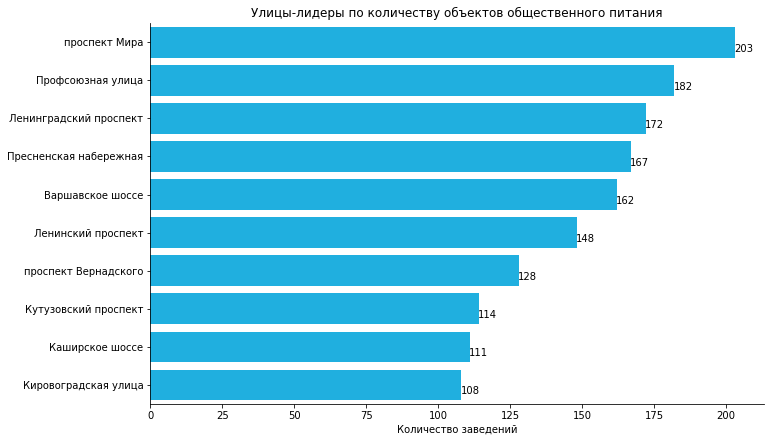

In [50]:
plt.figure(figsize=(11, 7))

g = sns.barplot(x='n_street_places', y='street', data = df_streets_top10, color = 'deepskyblue')
g.set_title('Улицы-лидеры по количеству объектов общественного питания')
g.set(ylabel=None)
g.set_xlabel('Количество заведений')
sns.despine(left=False, bottom=False, right=True)

# Аннотация и вывод графика
annotation_graphs(g, 'h_seats')
plt.show()

Данные таблиц и приведенной диаграммы показывают, что проспект Мира (протяженность 8.9 км), Профсоюзная улица (9.3 км) и Ленинградский проспект (5.6 км) - тройка лидеров по числу заведений общественного питания. Улицы-лидеры характеризуются большим числом районов, которые они пересекают.

Для более наглядного представления, нанесем заведения, относящиеся к улицам-лидерам, на карту города: 

In [51]:
# формирование датасета с запросом на улицы-лидеры
top10_streets = df_streets_top10['street'].tolist()
df_query = df_info.query('street in @top10_streets')

In [52]:
# создание карты в выбранных средних координатах
top10_streets_map = (
    folium.Map(location=[df_query['latitude'].mean(), df_query['longitude'].mean()], zoom_start=10, control_scale=True)
)

In [53]:
# нанесение геотегов для выбранного запроса и построение карты
for index, location_info in df_query.iterrows():
    folium.Marker([location_info['latitude'], location_info['longitude']], \
                  popup=location_info[['object_name', 'object_type']]).add_to(top10_streets_map)

top10_streets_map


Следует отметить, что для более полного анализа необходимо нормализовать данные числа заведений. Это возможно сделать несколькими способами, среди которых: (1) использовать протяженность каждой улицы или (2) площадь района для дополнительной оценки плотности расположения заведений питания в нем. Данные по протяженности улиц Москвы отсутствуют в открытом доступе, поэтому оценим в следующем пункте работы, какие районы являются лидерами по числу заведений питания с учетом их площади и числа жителей.

#### Районы-лидеры по числу заведений общественного питания

Используем [внешний датасет](https://ru.wikipedia.org/wiki/%D0%A0%D0%B0%D0%B9%D0%BE%D0%BD%D1%8B_%D0%B8_%D0%BF%D0%BE%D1%81%D0%B5%D0%BB%D0%B5%D0%BD%D0%B8%D1%8F_%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D1%8B) с информацией о площади и численности населения районов Москвы для оценки "плотности" размещения заведений и числа заведений на 1000 жителей для каждого района:

In [54]:
spreadsheet_id = '1cWJ_Y07NPfEHDycLfEe8jClWGq2-usQtbcEAtcmgL3Q'
file_name = 'https://docs.google.com/spreadsheets/d/{}/export?format=csv'.format(spreadsheet_id)
r = requests.get(file_name)
moscow_districts = pd.read_csv(BytesIO(r.content))
moscow_districts.head()

,district,adm_area_short,area_km_sq,population
0,Академический,ЮЗАО,5.83,110459
1,Алексеевский,СВАО,5.29,80449
2,Алтуфьевский,СВАО,3.25,57601
3,Арбат,ЦАО,2.11,36107
4,Аэропорт,САО,4.58,79413


Объединим данные таблицы, учитывающей район и число заведений в нём, с данными о площади района и числе жителей:

In [55]:
adm_area_district_area = adm_area_district.merge(moscow_districts, how='left', on='district').round(0)
adm_area_district_area.head()

,adm_area,district,n_food_places,adm_area_short,area_km_sq,population
0,Восточный,Богородское,103,ВАО,10.0,110044.0
1,Восточный,Вешняки,77,ВАО,11.0,121972.0
2,Восточный,Восточное Измайлово,42,ВАО,4.0,77931.0
3,Восточный,Восточный,4,ВАО,3.0,13698.0
4,Восточный,Гольяново,87,ВАО,15.0,162886.0


Вычислим количество заведений на 1 кв.км и 1000 жителей для каждого района города:

In [56]:
adm_area_district_area['n_food_places_per_area'] = (
                        (adm_area_district_area['n_food_places'] / adm_area_district_area['area_km_sq']).round(0)
)
    
adm_area_district_area['n_food_places_per_1000persons'] = (
                        (adm_area_district_area['n_food_places'] * 1000 / adm_area_district_area['population']).round(3) 
)

Представим ТОП-10 районов города, по числу заведений на 1 кв.км: 

In [57]:
top10_n_food_places_per_area = adm_area_district_area[['district','n_food_places_per_area']] \
                                .sort_values(by='n_food_places_per_area', ascending=False).reset_index(drop=True)
top10_n_food_places_per_area.head(10)

,district,n_food_places_per_area
0,Арбат,134.0
1,Тверской,111.0
2,Замоскворечье,97.0
3,Басманный,79.0
4,Мещанский,70.0
5,Пресненский,60.0
6,Таганский,45.0
7,Красносельский,45.0
8,Марьина Роща,38.0
9,Хамовники,38.0


Медианное число кафе на 1 кв.км для ТОП-10:

In [58]:
top10_n_food_places_per_area['n_food_places_per_area'].head(10).median()

65.0

Представим табличные данные в виде карты плотности распределения заведений питания в каждом районе: 

In [59]:
district_places = top10_n_food_places_per_area.merge(mos_districts, on='district', how='left')
district_places['n_food_places_per_area'].fillna(0, inplace=True)
gdf_area = gpd.GeoDataFrame(district_places, geometry = district_places.geometry)
gdf_area.crs = 'EPSG:4326'

In [60]:
district_area_map = folium.Map(location=[df_info['latitude'].mean(), df_info['longitude'].mean()], zoom_start=10)

In [61]:
# нанесение окраски районов в зависимости от количества заведений на 1 кв.км района

folium.Choropleth(
geo_data=gdf_area,
data=gdf_area,
columns=['district','n_food_places_per_area'],
key_on='feature.properties.district',
fill_color='YlGnBu',
fill_opacity=1,
line_opacity=0.2,
legend_name='Количество заведений на 1 кв.км',
smooth_factor=0,
Highlight= True,
line_color = '#0000',
name='choropleth',
show=False,
nan_fill_color='White',
overlay=True).add_to(district_area_map)

# модуль анимации легенды

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
NIL = folium.features.GeoJson(
    data = gdf_area,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['district','n_food_places_per_area'],
        aliases=['район','число заведений на 1 кв.км'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
district_area_map.add_child(NIL)
district_area_map.keep_in_front(NIL)

district_area_map

Приведем также ТОП-10 районов города с максимальным количеством заведений питания на 1 тыс. жителей:

In [62]:
top10_n_food_places_per_1000persons = adm_area_district_area[['district','n_food_places_per_1000persons']] \
                                .sort_values(by='n_food_places_per_1000persons', ascending=False).reset_index(drop=True)
top10_n_food_places_per_1000persons.head(10)

,district,n_food_places_per_1000persons
0,Тверской,10.070
1,Арбат,7.450
2,Якиманка,6.882
3,Замоскворечье,6.571
4,Мещанский,5.767
5,Басманный,5.728
6,Пресненский,5.623
7,Даниловский,4.883
8,Красносельский,4.680
9,поселение Сосенское,4.130


Отразим число заведений на 1000 жителей для каждого района на карте города: 

In [63]:
population_places = top10_n_food_places_per_1000persons.merge(mos_districts, on='district', how='left')
population_places['n_food_places_per_1000persons'].fillna(0, inplace=True)
gdf_population = gpd.GeoDataFrame(population_places, geometry = population_places.geometry)
gdf_population.crs = 'EPSG:4326'

In [64]:
# позиционирование карты в зависимости от средних координат широты и долготы
district_population_map = folium.Map(location=[df_info['latitude'].mean(), df_info['longitude'].mean()], zoom_start=10)

In [65]:
# нанесение окраски районов в зависимости от количества заведений на 1000 жителей

folium.Choropleth(
geo_data=gdf_population,
data=gdf_population,
columns=['district','n_food_places_per_1000persons'],
key_on='feature.properties.district',
fill_color='YlGnBu',
fill_opacity=1,
line_opacity=0.2,
legend_name='Количество заведений на 1000 жителей',
smooth_factor=0,
Highlight= True,
line_color = '#0000',
name='choropleth',
show=False,
nan_fill_color='White',
overlay=True).add_to(district_population_map)


# модуль анимации легенды

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
NIL = folium.features.GeoJson(
    data = gdf_population,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['district','n_food_places_per_1000persons'],
        aliases=['район','число заведений на 1 тыс. жителей'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
district_population_map.add_child(NIL)
district_population_map.keep_in_front(NIL)

district_population_map

Из обеих таблиц видно, что районы Тверской, Арбат и Замоскворечье - лидеры среди районов, а центральные районы Москвы являются наиболее популярными для размещения заведений общественного питания.

### Улицы с одним объектом общественного питания

Сформируем запрос на поиск улиц, где расположено только одно заведение общественного питания:

In [66]:
df_streets_one_place = (df_info.groupby('street')
                      .agg({'object_name':'count'})
                      .rename(columns={'object_name':'n_street_places'})
                      .sort_values(by='street')
                      .query('n_street_places == 1')
                      .reset_index()  
)
                    
df_streets_one_place.head()

,street,n_street_places
0,1-й Балтийский переулок,1
1,1-й Басманный переулок,1
2,1-й Ботанический проезд,1
3,1-й Вешняковский проезд,1
4,1-й Голутвинский переулок,1


Количество улиц, на которых находится по одному заведению общественного питания составляет 585.

Добавим названия районов, в которых находятся улицы с одним заведением общественного питания. Следует отметить, что некоторые улицы, могут пересекать несколько районов и в некоторых из них могут иметь по одному заведению:

In [67]:
df_streets_one_place = (df_info.groupby(['street','district'])
                      .agg({'object_name':'count'})
                      .rename(columns={'object_name':'n_street_places'})
                      .sort_values(by='street')
                      .query('n_street_places == 1')
                      .reset_index()  
)
                    
df_streets_one_place.head()

,street,district,n_street_places
0,1-й Балтийский переулок,Аэропорт,1
1,1-й Басманный переулок,Красносельский,1
2,1-й Ботанический проезд,Свиблово,1
3,1-й Вешняковский проезд,Рязанский,1
4,1-й Голутвинский переулок,Якиманка,1


### Распределение числа посадочных мест для улиц с большим количеством объектов питания

Рассмотрим более подробно распределение посадочных мест для ТОП-10 улиц с максимальным числом заведений питания, используя сформированный ранее датасет *df_query* для улиц-лидеров:

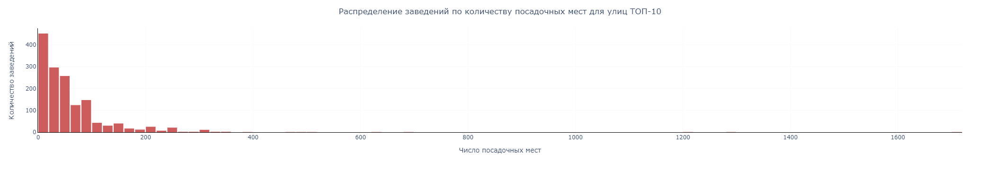

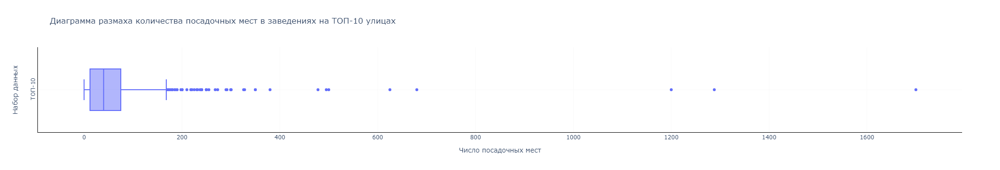

In [68]:
fig = (
    px.histogram(
            df_query,
            x='number',
            nbins = 160,
            color_discrete_sequence=['indianred'],
            labels={'number': 'число мест'})
)

fig.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='#f9f9f9')
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', gridcolor='#f9f9f9')

fig.update_layout(
    title='Распределение заведений по количеству посадочных мест для улиц ТОП-10',
    xaxis_title='Число посадочных мест',
    yaxis_title='Количество заведений',
    plot_bgcolor='#ffffff'
)

fig.update_layout(bargap=0.1)
fig.update(layout=dict(title=dict(x=0.5)))

fig.show()

fig = go.Figure()
fig.add_trace(go.Box(name='ТОП-10', x=df_query['number']))

fig.update_xaxes(showline=True, linewidth=1, linecolor='black', gridcolor='#f9f9f9')
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', gridcolor='#f9f9f9')

fig.update_layout(
    title='Диаграмма размаха количества посадочных мест в заведениях на ТОП-10 улицах',
    xaxis_title='Число посадочных мест',
    yaxis_title='Набор данных',
    plot_bgcolor='#ffffff'
)

fig.update_yaxes(
        tickangle = -90)

fig.show()

Диаграммы распределения и размаха позволяют сделать вывод, что для улиц-лидеров медианное число посадочных мест в заведении составляет 40. Также популярны небольшие заведения - до 20 посадочных мест и заведения в которых доступны от 40 до 60 мест. 

Найдем заведение питания с максимальным числом посадочных мест для посетителей в Москве и выведем его название:

In [69]:
df_info['number'].max()

1700

In [70]:
df_info.query('number == 1700')

,id,object_name,chain,object_type,address,number,city,territory,street,building,simple_address,adm_area,district,geodata_center,point,longitude,latitude
12674,199696,arena by soho family,нет,бар,"город Москва, Кутузовский проспект, дом 36, строение 11",1700,город Москва,город Москва,Кутузовский проспект,"дом 36, строение 11","Кутузовский проспект, дом 36, строение 11",Западный,Дорогомилово,0101000000F996FEAA6BC34240352FCC64F9DE4B40,POINT (37.52672326499118 55.74198589296285),37.526723264991183,55.741985892962852


Заведение называется [ARENA by SOHO FAMILY](https://arena.moscow/) и располагается на Кутузовском проспекте, одной из улиц, входящих в ТОП-10 по числу заведений питания.

Определим среднее количество посадочных мест, характерное для различных типов заведений для улиц, входящих в ТОП-10 и не входящих в них:

In [71]:
# вычисление среднего числа посадочных мест для каждого типа заведения, расположенного в ТОП-10 улиц
top10streets_mean_n_seats = (
    df_query.groupby('object_type').agg({'number':'mean'})
            .astype('int')
            .rename(columns={'number':'number_seats_top_10'})
            .sort_values(by='number_seats_top_10', ascending=True)
            .reset_index()
)

# формирование запроса на улицы, не входящие в ТОП-10
df_query_not_in_top10 = df_info.query('street not in @top10_streets')

# вычисление среднего числа посадочных мест для каждого типа заведения, не входящего в ТОП-10 улиц
not_in_top10_mean_n_seats = (
    df_query_not_in_top10.groupby('object_type').agg({'number':'mean'})
            .astype('int')
            .rename(columns={'number':'number_seats_not_in_top_10'})
            .sort_values(by='number_seats_not_in_top_10', ascending=True)
            .reset_index()
)

Ответим на вопрос, наблюдаются ли отличия между числом посадочных мест на улицах ТОП-10 и улицами за его пределами:

In [72]:
# формирование общего датасета для сравнения по числу посадочных мест
object_mean_seats_comparison = top10streets_mean_n_seats.merge(not_in_top10_mean_n_seats, on='object_type', how='left')
object_mean_seats_comparison

,object_type,number_seats_top_10,number_seats_not_in_top_10
0,магазин (отдел кулинарии),7,5
1,кафетерий,9,9
2,закусочная,17,7
3,предприятие быстрого обслуживания,23,20
4,кафе,41,39
5,буфет,43,51
6,бар,70,41
7,ресторан,99,96
8,столовая,140,129


В целом, можно отметить что отличия в числе посадочных мест незначительные, но они есть. В особенности это характерно для столовых и баров. Это связано с тем, что улицы-лидеры пересекают большое количество центральных районов с развитой деловой и туристской инфраструктурой, и расположенные там заведения пользуются большим спросом, что требует предоставление большего числа посадочных мест.

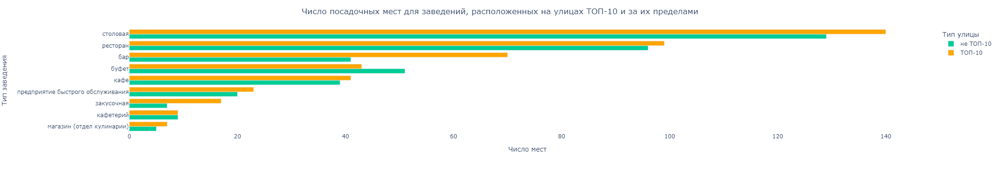

In [73]:
fig = (px.bar(object_mean_seats_comparison,
              x=['number_seats_not_in_top_10','number_seats_top_10'],
              y='object_type',
              barmode = 'group',
              hover_data={'variable':False},
              labels={'variable': 'Тип улицы', 'value':'число мест', 'object_type':'тип объекта'},
              color_discrete_map={'number':'#00bc00','number_seats_top_10':'#ffa500'})
      )

fig.for_each_trace(lambda t: t.update(name=t.name.replace('number_seats_not_in_top_10', 'не ТОП-10')))
fig.for_each_trace(lambda t: t.update(name=t.name.replace('number_seats_top_10', 'ТОП-10')))

fig.update_layout(
    title='Число посадочных мест для заведений, расположенных на улицах ТОП-10 и за их пределами',
    xaxis_title='Число мест',
    yaxis_title='Тип заведения',
    plot_bgcolor='#ffffff'
)

fig.update(layout=dict(title=dict(x=0.5)))

fig.show()

### Потенциальные районы для размещения кафе

Выберем потенциальные районы города для размещения кафе. В качестве совместного условия выберем районы, в которых размещено от 1 до 4-х кафе на 1 тыс.жителей, а также их общее число не превышает 65-ти (медианное значение для ТОП-10 районов). Такое условие позволит рассмотреть в основном центральные районы с относительно невысокой плотностью кафе.

In [74]:
district_population = district_places.merge(population_places, on =['district','adm_area','geometry'], how='left')
district_population.head()

,district,n_food_places_per_area,adm_area,geometry,n_food_places_per_1000persons
0,Арбат,134.0,Центральный,"POLYGON ((37.57206 55.75202, 37.57396 55.75256, 37.57505 55.75335, 37.57628 55.75463, 37.57651 55.75487, 37.57662 55.75499, 37...",7.450
1,Тверской,111.0,Центральный,"POLYGON ((37.57523 55.77552, 37.57599 55.77561, 37.57673 55.77575, 37.57746 55.77594, 37.57810 55.77615, 37.57999 55.77693, 37...",10.070
2,Замоскворечье,97.0,Центральный,"POLYGON ((37.61513 55.72688, 37.61761 55.72708, 37.61975 55.72728, 37.61991 55.72730, 37.61990 55.72739, 37.61988 55.72763, 37...",6.571
3,Басманный,79.0,Центральный,"POLYGON ((37.62790 55.75954, 37.62807 55.75961, 37.62826 55.75968, 37.62847 55.75974, 37.62866 55.75978, 37.62894 55.75984, 37...",5.728
4,Мещанский,70.0,Центральный,"POLYGON ((37.61225 55.78259, 37.61241 55.78262, 37.61255 55.78268, 37.61273 55.78288, 37.61291 55.78331, 37.61296 55.78338, 37...",5.767


Если ограничить потенциальное место размещения кафе только Центральным административным округом, то имеется два привлекательных района, удовлетворяющих первоначальным условиям: Таганский и Хамовники.

In [75]:
proposed_districts = (
    district_population.query(
    '(n_food_places_per_area < 60) & (1 <= n_food_places_per_1000persons <= 4) & adm_area == "Центральный"')
)
proposed_districts

,district,n_food_places_per_area,adm_area,geometry,n_food_places_per_1000persons
6,Таганский,45.0,Центральный,"POLYGON ((37.63211 55.74885, 37.63237 55.74952, 37.63239 55.74961, 37.63245 55.74981, 37.63254 55.75027, 37.63306 55.75180, 37...",2.946
9,Хамовники,38.0,Центральный,"POLYGON ((37.54108 55.72013, 37.54118 55.72206, 37.54186 55.72404, 37.54307 55.72557, 37.54490 55.72706, 37.54522 55.72719, 37...",3.448


In [76]:
# формирование датасета с запросом на выбранные районы
proposed_districts_list = proposed_districts['district'].tolist()
query_proposed_locations = df_info.query('district in @proposed_districts_list')

In [77]:
# создание карты в выбранных средних координатах
proposed_locations_map = (
    folium.Map(location=[query_proposed_locations['latitude'].mean(), query_proposed_locations['longitude'].mean()], zoom_start=13, control_scale=True)
)

In [78]:
# нанесение геотегов для выбранного запроса и построение карты
for index, location_info in query_proposed_locations.iterrows():
    folium.CircleMarker([location_info['latitude'], location_info['longitude']], \
                  popup=location_info[['object_name', 'object_type']],
                        radius = 2,
                        color = 'red',
                        fill_color = 'red',
                        fill_opacity = 0.6).add_to(proposed_locations_map)

proposed_locations_map

Рассмотрим, какие помещения доступны для аренды под кафе в районе Таганский, используя базу данных [cian.ru](https://www.cian.ru/snyat-pomeshenie-pod-obshepit-moskva-taganskiy-0419/):

Одним из вариантов решения может быть парсинг данных с использованием BeautifulSoup. Извлеченные данные адресов для первой страницы объявлений показаны ниже.

In [79]:
URL = 'https://www.cian.ru/snyat-pomeshenie-pod-obshepit-moskva-taganskiy-0419/'
req = requests.get(URL)  # GET-запрос
soup = BeautifulSoup(req.text, 'lxml')

In [80]:
name_locations = []  # Список, в котором хранятся данные о расположении здания доступного в аренду
for row in soup.find_all(
    'div', attrs={'class': 'c6e8ba5398--address-path--2Z9T3'}
):
    name_locations.append(row.text)

In [81]:
name_locations

['Москва, ЦАО, р-н Таганский, м. Марксистская, Таганская улица, 24С1',
 'Москва, ЦАО, р-н Таганский, м. Таганская, улица Земляной Вал, 60',
 'Москва, ЦАО, р-н Таганский, м. Марксистская, Товарищеский переулок, 1С3',
 'Москва, ЦАО, р-н Таганский, м. Чкаловская, улица Земляной Вал, 48А',
 'Москва, ЦАО, р-н Таганский, м. Курская, Серебряническая набережная, 29С2',
 'Москва, ЦАО, р-н Таганский, м. Таганская, улица Станиславского, 15',
 'Москва, ЦАО, р-н Таганский, м. Пролетарская, Нижегородская улица, 2К1',
 'Москва, ЦАО, р-н Таганский, м. Пролетарская, Нижегородская улица, 2К1',
 'Москва, ЦАО, р-н Таганский, м. Пролетарская, Таганская улица, 31/22',
 'Москва, ЦАО, р-н Таганский, м. Пролетарская, Абельмановская улица, 7',
 'Москва, ЦАО, р-н Таганский, м. Курская, Наставнический переулок, 3',
 'Москва, ЦАО, р-н Таганский, м. Марксистская, Товарищеский переулок, 19',
 'Москва, ЦАО, р-н Таганский, м. Марксистская, Таганская улица, 24С1',
 'Москва, ЦАО, р-н Таганский, м. Площадь Ильича, Гжельс

Для визуализации используем данные базы предоставленные самим сервисом ЦИАН, а координаты заведений получим, используя сервис [DaData](https://dadata.ru/)

In [82]:
spreadsheet_id = '1iISbbgMpmRo9YZAEc1XItII0FVoFF-RVM7i31qGkIIo'
file_name = 'https://docs.google.com/spreadsheets/d/{}/export?format=csv'.format(spreadsheet_id)

cian = pd.read_csv(file_name)


cian.head()

,area,address,floor,ceiling_hight,phone,latitude,longitude
0,"346.8, м2","Гончарная улица, 38",1/14,4.0,+79680124336,55.740890499999999,37.650699899999999
1,"320.0, м2","улица Нижняя Радищевская, 5с2",2/2,NaN,+79060599076,55.741846899999999,37.653382000000001
2,"160.0, м2","Товарищеский переулок, 1С3",1/2,3.0,"+79346625090, +79346627959",55.741501300000003,37.657702600000000
3,"219.0, м2","улица Земляной Вал, 48А",-1/9,4.0,+79057130366,55.752288000000000,37.655372999999997
4,"786.0, м2","улица Станиславского, 15",1/2,NaN,+79850077514,55.744984100000003,37.661305100000000


Добавим на карту синие метки, с доступными заведениями для аренды для района Таганский:

In [83]:
# создание карты в выбранных средних координатах
cian_taganskiy_map = (
    folium.Map(location=[cian['latitude'].mean(), cian['longitude'].mean()], zoom_start=13, control_scale=True)
)

In [84]:
# нанесение геотегов для выбранного запроса и построение карты
for index, location_info in cian.iterrows():
    folium.CircleMarker([location_info['latitude'], location_info['longitude']], \
                  popup=location_info[['area', 'address']],
                        radius = 2,
                        color = 'blue',
                        fill_color = 'blue',
                        fill_opacity = 0.6).add_to(proposed_locations_map)

proposed_locations_map

Одним из возможных мест размещения кафе может служить область в районе Детского Таганского парка, которая привлекательна как с точки зрения близости к метро и оживлённости Таганской улицы, так и её расположения недалеко от места отдыха жителей. 

**Промежуточные выводы:**
* Заведения общественного питания Москвы в основном представлены кафе, чья доля (39.7%) в общем числе заведений сопоставима с суммарной долей столовых (16.9%), ресторанов (14.9%) и фастфудов (12.4%). Бары и буфеты в общепите города составляют 5.6% и 3.8% соответственно. Кафетерии (2.6%), закусочные (2.3%) и кулинарии (1.8%) – типы заведений, наименее распространенные на рынке общественного питания Москвы.
* Доля заведений, относящихся к сетям, составляет примерно 20% от всех заведений общественного питания. 
Распределение доли сетевых и несетевых заведений общественного питания в общем числе заведений Москвы показывает, что среди несетевых типов заведений превалируют кафе (30.6%), столовые (16.9%) и рестораны (11.4%). Сетевой характер бизнеса привлекателен для кафе (9.1%), предприятий быстрого обслуживания(5.2%) и ресторанов (3.6%).
* В разрезе типов заведений сетевое распространение характерно для предприятий быстрого обслуживания (фастфудов) – 41.5%, а также отделов кулинарий – 28.6%, которые чаще всего находятся в продуктовых магазинах торговых сетей. Третью строчку по популярности сетевой организации бизнеса делят рестораны и кафе (~23%). Наименьшую склонность к сетевой организации общественного питания Москвы имеют столовые (0.1%).
* Среднее число посадочных мест для сетевых заведений равно 53-м (медианное – 40). Для сетевых объектов питания более характерно распространение небольшого или среднего числа заведений с небольшим или средним числом посадочных мест. Исключением может являться сеть быстрого питания Макдональдс, для которой помимо большого размаха сети характерно большое количество посадочных мест в заведениях.
* Максимальное среднее число посадочных мест для различных типов заведений характерно для столовых (130), ресторанов (97) и буфетов (51). Минимальное – для кафетериев (9), закусочных (8) и кулинарий (6).
* Улицы-лидеры по числу заведений общественного питания Москвы: проспект Мира, Профсоюзная улица и Ленинградский проспект. Они характеризуются большим числом районов города, которые пересекают.
* Для улиц-лидеров медианное число посадочных мест в заведении составляет 40. Популярны также небольшие заведения - до 20 посадочных мест, и заведения, в которых доступны от 40 до 60 мест.
* Районы Тверской, Арбат и Замоскворечье - лидеры среди районов по числу заведений на 1 кв.км и 1 тыс. жителей.  В целом,  центральные районы Москвы являются наиболее популярными для размещения заведений общественного питания.
* Наблюдаются отличия между числом посадочных мест на улицах ТОП-10 и улицами за его пределами. В особенности это заметно для столовых и баров, где заведения улиц-лидеров представлены большим числом посадочных мест.

## Общие выводы

* Исходный датасет по объектам общественного питания Москвы содержит необходимую информацию для проведения исследования, но требует тщательной предварительной обработки для уточнения названий заведений, их адресов и устранения дубликатов.
* Внешний источники данных, такие как административно-территориальное деление, площадь районов и число жителей в них, позволяют проанализировать более подробно распределение заведений для различных районов города, а геоданные позволяют визуализировать сходства и различия на карте города.
* Исследование позволило ответить на вопрос о соотношении видов объектов общественного питания по количеству и установить, что, например, доля кафе (39.7%) в общем числе заведений сопоставима с суммарной долей столовых (16.9%), ресторанов (14.9%) и фастфудов (12.4%).
* Анализ сетевых заведений показал, что их доля в общепите составляет 1/5 от всех заведений Москвы. Лидерами по числу заведений являются KFC, Шоколадница и Макдональдс.
* В разрезе типов заведений сетевое распространение характерно для предприятий быстрого обслуживания (фастфудов) – 41.5%, а также отделов кулинарий – 28.6%, которые чаще всего находятся в продуктовых магазинах торговых сетей.
* Для сетевых объектов питания более характерно распространение небольшого или среднего числа заведений с небольшим или средним числом посадочных мест. Среднее число посадочных мест для сетевых заведений равно 53-м (медианное – 40).
* Максимальное среднее число посадочных мест для различных типов заведений характерно для столовых (130), ресторанов (97) и буфетов (51). Минимальное – для кафетериев (9), закусочных (8) и кулинарий (6).
* Улицы-лидеры по числу заведений общественного питания Москвы: проспект Мира, Профсоюзная улица и Ленинградский проспект. Они характеризуются большим числом районов города, которые пересекают. Следует однако учитывать их протяженность, и для будущего исследования нормировать данные.
* Районы Тверской, Арбат и Замоскворечье - лидеры среди районов по числу заведений на 1 кв.км и 1 тыс. жителей.  В целом,  центральные районы Москвы являются наиболее популярными для размещения заведений общественного питания.

**Рекомендации:**
* При планировании и реализации проекта по организации кафе, следует учитывать их высокую долю на рынке общественного питания.
* Следует обратить внимание на локацию кафе. В центральных районах города высокий спрос на услуги общепита со стороны жителей и туристов. Вместе с тем, центральные районы - это высокая арендная плата и конкуренция среди заведений. Оптимальным может быть центральный район города (к примеру, Таганский), где относительно невелико количество заведений на 1 кв.км и на 1 тыс. жителей. Альтернативой может стать интенсивно развивающийся деловой район города.
* Требуется обратить внимание на количество посадочных мест. В среднем для кафе - это 40, но в зависимости от близости к центру это число можно увеличить. Безусловно, следует учитывать сопутствующие расходы и бизнес-модель заведения.
* Кафе относятся к видам сетевых заведений. Одним из направлений развития бизнеса может служить открытие заведений в крупных торговых центрах, что позволит не только привлечь внимание к заведению большого количество людей за короткое время, но и постоянно увеличивать число клиентов. 

## Презентация

Презентация для инвесторов расположена по [ссылке](https://drive.google.com/file/d/1a9qK9Thv5jE-0ZSIeUTooO7O_kuw3Cp2/view?usp=sharing)